In [0]:
%pip install pymongo


Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
from pymongo import MongoClient
import pandas as pd


In [0]:

#replacing the url with the url provided by ngrok
mongo_uri = "mongodb://0.tcp.ngrok.io:19932/"


In [0]:

# Connect to MongoDB
client = MongoClient(mongo_uri)


In [0]:
db = client["my_database"]
collection = db["my_collection"]



In [0]:
print(collection.count_documents({}))


243553


In [0]:
from pymongo import MongoClient
import pandas as pd

# Retrieve data from the collection and ensure all entries are processed
data = list(collection.find())

# Check the number of documents retrieved
print(f"Total documents retrieved: {len(data)}")

# Convert the `_id` field to a string for compatibility
for document in data:
    document["_id"] = str(document["_id"])

# Convert the data to a DataFrame
df = pd.DataFrame(data)

# Verify if the DataFrame has all entries
print(f"Total rows in DataFrame: {len(df)}")

# Display the DataFrame
display(df)


Total documents retrieved: 243553
Total rows in DataFrame: 243553


_id,customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
6733e0fd586af6e7023e2a5b,3,Vodafone,F,57,Arunachal Pradesh,Delhi,423976,2020-01-01,0,148828,49,24,193,1
6733e0fd586af6e7023e2a5c,17,Vodafone,M,61,Himachal Pradesh,Hyderabad,734068,2020-01-01,2,59723,16,42,8157,1
6733e0fd586af6e7023e2a5d,18,Reliance Jio,M,59,Madhya Pradesh,Hyderabad,940945,2020-01-01,1,101694,80,20,2605,0
6733e0fd586af6e7023e2a5e,19,Airtel,F,47,Manipur,Delhi,630028,2020-01-01,1,138037,60,28,1432,0
6733e0fd586af6e7023e2a5f,9,Reliance Jio,F,53,Himachal Pradesh,Mumbai,765257,2020-01-01,2,79439,34,12,10039,0
6733e0fd586af6e7023e2a60,20,Vodafone,M,26,Uttar Pradesh,Hyderabad,516585,2020-01-01,1,109753,95,-1,9993,0
6733e0fd586af6e7023e2a61,22,Vodafone,M,66,West Bengal,Bangalore,504153,2020-01-01,2,64468,57,10,8141,0
6733e0fd586af6e7023e2a62,23,BSNL,F,26,Arunachal Pradesh,Chennai,893238,2020-01-01,0,65263,79,0,4426,0
6733e0fd586af6e7023e2a63,21,Vodafone,F,58,Goa,Bangalore,316225,2020-01-01,1,118578,94,50,2214,0
6733e0fd586af6e7023e2a64,24,Reliance Jio,F,71,Gujarat,Bangalore,264045,2020-01-01,1,110373,25,24,2533,0


In [0]:
data = df.drop(columns=['_id'])
display(data)



customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
3,Vodafone,F,57,Arunachal Pradesh,Delhi,423976,2020-01-01,0,148828,49,24,193,1
17,Vodafone,M,61,Himachal Pradesh,Hyderabad,734068,2020-01-01,2,59723,16,42,8157,1
18,Reliance Jio,M,59,Madhya Pradesh,Hyderabad,940945,2020-01-01,1,101694,80,20,2605,0
19,Airtel,F,47,Manipur,Delhi,630028,2020-01-01,1,138037,60,28,1432,0
9,Reliance Jio,F,53,Himachal Pradesh,Mumbai,765257,2020-01-01,2,79439,34,12,10039,0
20,Vodafone,M,26,Uttar Pradesh,Hyderabad,516585,2020-01-01,1,109753,95,-1,9993,0
22,Vodafone,M,66,West Bengal,Bangalore,504153,2020-01-01,2,64468,57,10,8141,0
23,BSNL,F,26,Arunachal Pradesh,Chennai,893238,2020-01-01,0,65263,79,0,4426,0
21,Vodafone,F,58,Goa,Bangalore,316225,2020-01-01,1,118578,94,50,2214,0
24,Reliance Jio,F,71,Gujarat,Bangalore,264045,2020-01-01,1,110373,25,24,2533,0


In [0]:
# Convert the Pandas DataFrame to a Spark DataFrame
spark_df = spark.createDataFrame(data)


In [0]:
spark_df.printSchema()


root
 |-- customer_id: long (nullable = true)
 |-- telecom_partner: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: long (nullable = true)
 |-- state: string (nullable = true)
 |-- city: string (nullable = true)
 |-- pincode: long (nullable = true)
 |-- date_of_registration: string (nullable = true)
 |-- num_dependents: long (nullable = true)
 |-- estimated_salary: long (nullable = true)
 |-- calls_made: long (nullable = true)
 |-- sms_sent: long (nullable = true)
 |-- data_used: long (nullable = true)
 |-- churn: long (nullable = true)



In [0]:
display(spark_df)

customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
3,Vodafone,F,57,Arunachal Pradesh,Delhi,423976,2020-01-01,0,148828,49,24,193,1
17,Vodafone,M,61,Himachal Pradesh,Hyderabad,734068,2020-01-01,2,59723,16,42,8157,1
18,Reliance Jio,M,59,Madhya Pradesh,Hyderabad,940945,2020-01-01,1,101694,80,20,2605,0
19,Airtel,F,47,Manipur,Delhi,630028,2020-01-01,1,138037,60,28,1432,0
9,Reliance Jio,F,53,Himachal Pradesh,Mumbai,765257,2020-01-01,2,79439,34,12,10039,0
20,Vodafone,M,26,Uttar Pradesh,Hyderabad,516585,2020-01-01,1,109753,95,-1,9993,0
22,Vodafone,M,66,West Bengal,Bangalore,504153,2020-01-01,2,64468,57,10,8141,0
23,BSNL,F,26,Arunachal Pradesh,Chennai,893238,2020-01-01,0,65263,79,0,4426,0
21,Vodafone,F,58,Goa,Bangalore,316225,2020-01-01,1,118578,94,50,2214,0
24,Reliance Jio,F,71,Gujarat,Bangalore,264045,2020-01-01,1,110373,25,24,2533,0


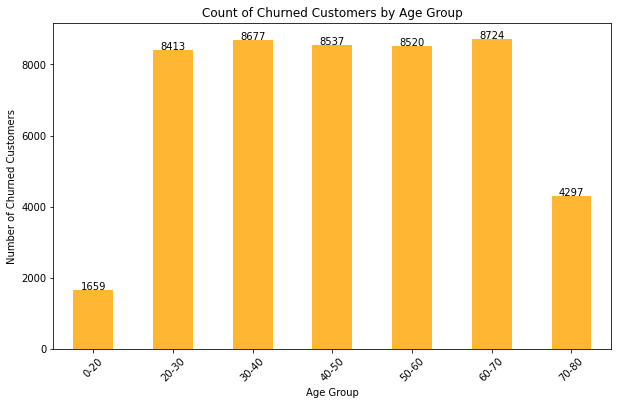

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
#Finding how many customers have churned in each age group
age_churn_df = spark_df.select("age", "churn").toPandas()
age_churn_df = age_churn_df.dropna()
bins = [0, 20, 30, 40, 50, 60, 70, 80]
labels = ['0-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80']
age_churn_df['age_group'] = pd.cut(age_churn_df['age'], bins=bins, labels=labels, right=False)
churned_df = age_churn_df[age_churn_df['churn'] == 1]
churn_counts = churned_df['age_group'].value_counts().sort_index()
plt.figure(figsize=(10, 6))
ax = churn_counts.plot(kind='bar', color='orange', alpha=0.8)

for i, count in enumerate(churn_counts):
    plt.text(i, count + 0.5, str(count), ha='center', fontsize=10)

plt.title("Count of Churned Customers by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Number of Churned Customers")
plt.xticks(rotation=45)
plt.show()





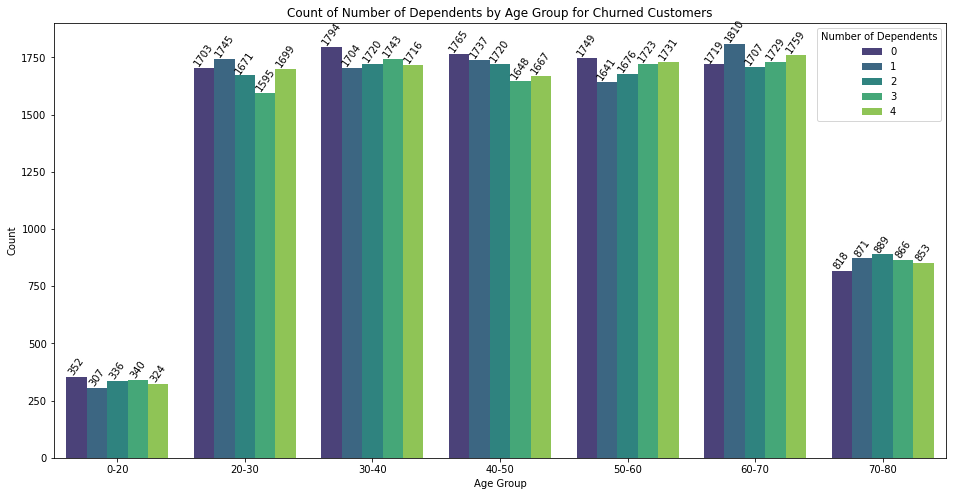

In [0]:
# Filter Spark DataFrame for churned customers
#Checking the relationship between age group and number of dependents for churned customers
churned_df = spark_df.filter(spark_df['churn'] == 1)
age_dependents_df = churned_df.select("age", "num_dependents").toPandas()
bins = [0, 20, 30, 40, 50, 60, 70, 80]
labels = ['0-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80']
age_dependents_df['age_group'] = pd.cut(age_dependents_df['age'], bins=bins, labels=labels, right=False)
age_dependents_counts = age_dependents_df.groupby(['age_group', 'num_dependents']).size().reset_index(name='count')
plt.figure(figsize=(16, 8))
ax = sns.barplot(data=age_dependents_counts, x='age_group', y='count', hue='num_dependents', palette='viridis')
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', label_type='edge', rotation=55)
plt.title("Count of Number of Dependents by Age Group for Churned Customers")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.legend(title="Number of Dependents")
plt.show()



In [0]:
spark_df.describe("estimated_salary").show()


+-------+------------------+
|summary|  estimated_salary|
+-------+------------------+
|  count|            243553|
|   mean| 85021.13783858133|
| stddev|37508.963233059614|
|    min|             20000|
|    max|            149999|
+-------+------------------+



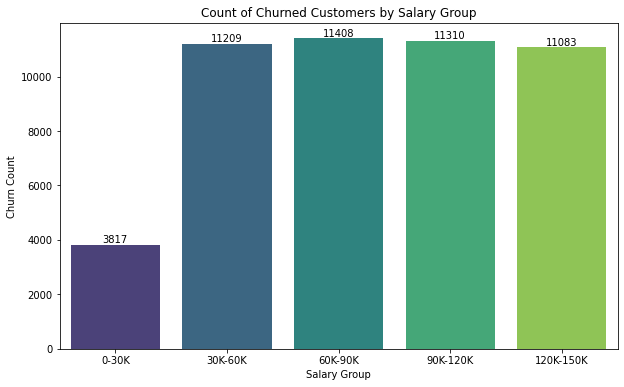

In [0]:
#Finding how many customers have churned in each salary group
salary_churn_df = spark_df.select("estimated_salary", "churn").toPandas()
bins = [0, 30000, 60000, 90000, 120000, 150000]
labels = ['0-30K', '30K-60K', '60K-90K', '90K-120K', '120K-150K']
salary_churn_df['salary_group'] = pd.cut(salary_churn_df['estimated_salary'], bins=bins, labels=labels, right=False)
churned_customers = salary_churn_df[salary_churn_df['churn'] == 1]
salary_group_churn_counts = churned_customers['salary_group'].value_counts(sort=False).reset_index()
salary_group_churn_counts.columns = ['salary_group', 'churn_count']

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=salary_group_churn_counts, x='salary_group', y='churn_count', palette="viridis")

for i in ax.containers:
    ax.bar_label(i, fmt='%.0f', label_type='edge')

plt.title("Count of Churned Customers by Salary Group")
plt.xlabel("Salary Group")
plt.ylabel("Churn Count")
plt.show()



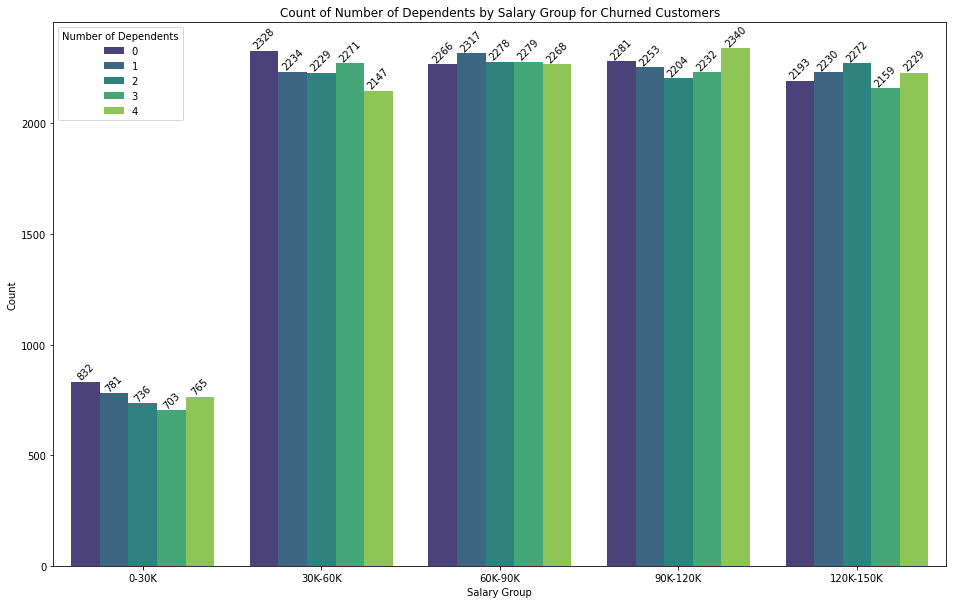

In [0]:

# observing the relationship between estimated salary groups and number of dependents of the churned customers
churned_df = spark_df.filter(spark_df['churn'] == 1)
salary_dependents_df = churned_df.select("estimated_salary", "num_dependents").toPandas()
bins = [0, 30000, 60000, 90000, 120000, 150000]
labels = ['0-30K', '30K-60K', '60K-90K', '90K-120K', '120K-150K']
salary_dependents_df['salary_group'] = pd.cut(salary_dependents_df['estimated_salary'], bins=bins, labels=labels, right=False)
salary_dependents_counts = salary_dependents_df.groupby(['salary_group', 'num_dependents']).size().reset_index(name='count')
plt.figure(figsize=(16, 10))
ax = sns.barplot(data=salary_dependents_counts, x='salary_group', y='count', hue='num_dependents', palette='viridis')
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', label_type='edge', rotation=45)
plt.title("Count of Number of Dependents by Salary Group for Churned Customers")
plt.xlabel("Salary Group")
plt.ylabel("Count")
plt.legend(title="Number of Dependents")
plt.show()



In [0]:
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.sql import SparkSession
from pyspark.ml.feature import StringIndexer, VectorAssembler, StandardScaler
from pyspark.ml import Pipeline
from pyspark.sql.functions import col, when
from pyspark.ml.classification import GBTClassifier
from pyspark.sql.functions import col, when, udf
from pyspark.sql.types import ArrayType, FloatType
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

sample_data = spark_df
# Drop irrelevant columns
columns_to_drop = ['customer_id', 'state', 'city', 'pincode', 'date_of_registration']
sample_data = sample_data.drop(*columns_to_drop)

# Replace negative values in 'data_used' with zero
sample_data = sample_data.withColumn('data_used', when(col('data_used') < 0, 0).otherwise(col('data_used')))

# Encode categorical columns with StringIndexer
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index").fit(sample_data) for col in ['telecom_partner', 'gender']]
assembler = VectorAssembler(inputCols=[c for c in sample_data.columns if c not in ['churn', 'telecom_partner', 'gender']], outputCol="features")
scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)

# Create a pipeline for data preprocessing
pipeline = Pipeline(stages=indexers + [assembler, scaler])
sample_data = pipeline.fit(sample_data).transform(sample_data)
sample_data = sample_data.select("scaled_features", "churn").withColumnRenamed("scaled_features", "features")

# Split into train and test sets
train_data, test_data = sample_data.randomSplit([0.8, 0.2], seed=42)


In [0]:
models = ['Random Forest','Gradient Boosting','SVM(Linear)','SVM(Poly)','SVM(Rbf)','SVM(Sigmoid)']
Acc,Prec,Rec,F1s=[],[],[],[]


In [0]:

# Initialize Random Forest
random_forest = RandomForestClassifier(featuresCol="features", labelCol="churn", numTrees=40, maxDepth=5)

# Fit the model
rf_model = random_forest.fit(train_data)

# Make predictions on the test set
predictions_rf = rf_model.transform(test_data)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="accuracy")
acc_rf = evaluator.evaluate(predictions_rf)
precision_evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="weightedPrecision")
recall_evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="weightedRecall")
f1_evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="f1")

prec_rf = precision_evaluator.evaluate(predictions_rf)
rec_rf = recall_evaluator.evaluate(predictions_rf)
f1_rf = f1_evaluator.evaluate(predictions_rf)

print(f"Random Forest Results:")
print(f"  Accuracy: {acc_rf}")
print(f"  Precision: {prec_rf}")
print(f"  Recall: {rec_rf}")
print(f"  F1 Score: {f1_rf}")
Acc.append(acc_rf)
Prec.append(prec_rf)
Rec.append(rec_rf)
F1s.append(f1_rf)


Random Forest Results:
  Accuracy: 0.8006233744788012
  Precision: 0.6409977877618226
  Recall: 0.8006233744788012
  F1 Score: 0.7119731942248749


In [0]:

# Initialize Gradient Boosting
gradient_boosting = GBTClassifier(featuresCol="features", labelCol="churn", maxIter=60, maxDepth=5)

# Fit the model
gb_model = gradient_boosting.fit(train_data)

# Make predictions on the test set
predictions_gb = gb_model.transform(test_data)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="accuracy")
acc_gb = evaluator.evaluate(predictions_gb)
precision_evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="weightedPrecision")
recall_evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="weightedRecall")
f1_evaluator = MulticlassClassificationEvaluator(labelCol="churn", metricName="f1")

prec_gb = precision_evaluator.evaluate(predictions_gb)
rec_gb = recall_evaluator.evaluate(predictions_gb)
f1_gb = f1_evaluator.evaluate(predictions_gb)

print(f"Gradient Boosting Results:")
print(f"  Accuracy: {acc_gb}")
print(f"  Precision: {prec_gb}")
print(f"  Recall: {rec_gb}")
print(f"  F1 Score: {f1_gb}")
Acc.append(acc_gb)
Prec.append(prec_gb)
Rec.append(rec_gb)
F1s.append(f1_gb)

Gradient Boosting Results:
  Accuracy: 0.800602732939768
  Precision: 0.7207650172897915
  Recall: 0.8006027329397679
  F1 Score: 0.712041457628247


In [0]:
sample_data = spark_df.sample(fraction=0.5, seed=42)
columns_to_drop = ['customer_id', 'state', 'city', 'pincode', 'date_of_registration']
sample_data = sample_data.drop(*columns_to_drop)
sample_data = sample_data.withColumn('data_used', when(col('data_used') < 0, 0).otherwise(col('data_used')))
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index").fit(sample_data) for col in ['telecom_partner', 'gender']]
assembler = VectorAssembler(inputCols=[c for c in sample_data.columns if c not in ['churn', 'telecom_partner', 'gender']], outputCol="features")
scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)
pipeline = Pipeline(stages=indexers + [assembler, scaler])
sample_data = pipeline.fit(sample_data).transform(sample_data)
def vector_to_array(vector):
    return vector.toArray().tolist()

vector_to_array_udf = udf(vector_to_array, ArrayType(FloatType()))
sample_data = sample_data.withColumn("features_array", vector_to_array_udf(col("scaled_features")))
pandas_df = sample_data.select("features_array", "churn").toPandas()

# Prepare features and labels
X = np.array(pandas_df["features_array"].tolist())
y = pandas_df["churn"]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [0]:
 
# Initializing and training the SVM model with linear kernel
svm = SVC(kernel='linear', class_weight='balanced', random_state=42)
svm.fit(X_train, y_train)

# Making predictions on the test set
y_pred = svm.predict(X_test)

# Calculating and printing metrics
acc_svl = accuracy_score(y_test, y_pred)
prec_svl = precision_score(y_test, y_pred, zero_division=1)
rec_svl = recall_score(y_test, y_pred, zero_division=1)
f1_svl = f1_score(y_test, y_pred, zero_division=1)

print("SVM Results:")
print(f"  Accuracy: {acc_svl}")
print(f"  Precision: {prec_svl}")
print(f"  Recall: {rec_svl}")
print(f"  F1 Score: {f1_svl}")
Acc.append(acc_svl)
Prec.append(prec_svl)
Rec.append(rec_svl)
F1s.append(f1_svl)



SVM Results:
  Accuracy: 0.5211964443349552
  Precision: 0.19871482384223355
  Recall: 0.4610322845979848
  F1 Score: 0.27772444334334645


In [0]:
# Initialize and train the SVM model with poly kernel
svm = SVC(kernel='poly',degree=3 , class_weight='balanced', random_state=42)  
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
acc_svp = accuracy_score(y_test, y_pred)
prec_svp = precision_score(y_test, y_pred, zero_division=1)
rec_svp = recall_score(y_test, y_pred, zero_division=1)
f1_svp = f1_score(y_test, y_pred, zero_division=1)

print("SVM Results:")
print(f"  Accuracy: {acc_svp}")
print(f"  Precision: {prec_svp}")
print(f"  Recall: {rec_svp}")
print(f"  F1 Score: {f1_svp}")
Acc.append(acc_svp)
Prec.append(prec_svp)
Rec.append(rec_svp)
F1s.append(f1_svp)

In [0]:
# Initialize and train the SVM model with rbf kernel
svm = SVC(kernel='rbf', class_weight='balanced', random_state=42)  
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
acc_svr = accuracy_score(y_test, y_pred)
prec_svr = precision_score(y_test, y_pred, zero_division=1)
rec_svr = recall_score(y_test, y_pred, zero_division=1)
f1_svr = f1_score(y_test, y_pred, zero_division=1)

print("SVM Results:")
print(f"  Accuracy: {acc_svr}")
print(f"  Precision: {prec_svr}")
print(f"  Recall: {rec_svr}")
print(f"  F1 Score: {f1_svr}")
Acc.append(acc_svr)
Prec.append(prec_svr)
Rec.append(rec_svr)
F1s.append(f1_svr)

SVM Results:
  Accuracy: 0.5009546098417196
  Precision: 0.20019736030590848
  Recall: 0.500616903146206
  F1 Score: 0.2860163891091726


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-684645430991902>:15
     13 print(f"  Recall: {rec_svr}")
     14 print(f"  F1 Score: {f1_svr}")
---> 15 Acc.append(acc_svr)
     16 Prec.append(prec_svr)
     17 Rec.append(rec_svr)

NameError: name 'Acc' is not defined

In [0]:
# Initialize and train the SVM model with sigmoid kernel
svm = SVC(kernel='sigmoid', class_weight='balanced', random_state=42)  
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
acc_svs = accuracy_score(y_test, y_pred)
prec_svs = precision_score(y_test, y_pred, zero_division=1)
rec_svs = recall_score(y_test, y_pred, zero_division=1)
f1_svs = f1_score(y_test, y_pred, zero_division=1)

print("SVM Results:")
print(f"  Accuracy: {acc_svs}")
print(f"  Precision: {prec_svs}")
print(f"  Recall: {rec_svs}")
print(f"  F1 Score: {f1_svs}")
Acc.append(acc_svs)
Prec.append(prec_svs)
Rec.append(rec_svs)
F1s.append(f1_svs)

In [0]:
import matplotlib.pyplot as plt
import numpy as np
# Metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
data = [Acc,Prec,Rec,F1s]

# Plotting
x = np.arange(len(models))  # Label locations
width = 0.2  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))

# Bars for each metric
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, data[i], width, label=metric)

# Formatting
ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Comparison of Model Performance Metrics')
ax.set_xticks(x + width * (len(metrics) - 1) / 2)
ax.set_xticklabels(models)
ax.legend()

plt.tight_layout()
plt.show()
